# Dimension Reduction Process

## 1. Principal Component Analysis (PCA)

### Brief primer and history
Principal component analysis (PCA) is a statistical procedure that uses an [orthogonal transformation](https://en.wikipedia.org/wiki/Orthogonal_transformation) to convert a set of observations of possibly correlated variables into a set of values of [linearly uncorrelated](https://en.wikipedia.org/wiki/Correlation_and_dependence) variables called principal components. The number of distinct principal components is equal to the smaller of the number of original variables or the number of observations minus one. This transformation is defined in such a way that the first principal component has the largest possible [variance](https://en.wikipedia.org/wiki/Variance) (that is, accounts for as much of the variability in the data as possible), and each succeeding component in turn has the highest variance possible under the constraint that it is [orthogonal](https://en.wikipedia.org/wiki/Orthogonal) the preceding components. The resulting vectors are an uncorrelated [orthogonal basis set](https://en.wikipedia.org/wiki/Orthogonal_basis_set). 

PCA is sensitive to the relative scaling of the original variables.

PCA was invented in 1901 by [Karl Pearson](https://en.wikipedia.org/wiki/Karl_Pearson) as an analogue of the principal axis theorem in mechanics; it was later independently developed and named by [Harold Hotelling](https://en.wikipedia.org/wiki/Harold_Hotelling) in the 1930s.

### Note : Data scaling
PCA requires scaling/normalization of the data to work properly

## 2. Isometric Mapping
Isomap stands for "Isometric Mapping." It is a dimensionality reduction technique that aims to preserve the geodesic distances between data points in a lower-dimensional space. Isomap is particularly useful for nonlinear data, as it attempts to unfold the underlying manifold structure of the data. By considering the nearest neighbors of each data point, Isomap constructs a graph and computes the shortest path distances between all pairs of points. It then uses these distances to create a low-dimensional embedding of the data.

**Notice**:
The aproach that I have applied in `feature_selection.ipynb` base on, outlier removal and not removal is going to be applied in both notebooks `dimension_reduction.ipynb` and `regression_model.ipynb` too.

## Feature Selection Libraries
  There are a few critical libraries that are used for Feature Selection in general.
  Here is a short summary of those and what they do:
  1. Numpy - Manipulation for multi-dimensional arrays and matrices.
  
  2. Pandas - Data import and manipulation.
  
  3. Matplotlib - Data visualization.
  
  4. Seaborn - Based on matplotlib; plotting statistical graphics.
  
  5. VarianceThreshold - Used to select features based on their variance.
  This can be useful for reducing the dimensionality of a dataset, or for removing features that are not informative.
  
  6. Normalize - used to normalize features to have a mean of 0 and a standard deviation of 1. This can be useful for improving the performance of some machine learning algorithms. 

  7. StandardScaler - Used for data Normalization.

  8. PCA 

  9. Isomap

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline 
from matplotlib import cm as cm
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap

##### Code Explanation

- `Classes`
    1. `describe`: In this part a box whisker which is gouped by ouput category  for each column will be plotted .
    (Remember that the category of out put is 0 : unkown, 1 : positive, 2 : negetive)

    2. `data_scaling`: This is the normalization part which is required for any kind of dimension reduction algorithms like PCA.

    3. `principle_component_analysis`: This is the PCA method, the variance ratio have been plotted (result of it have been explaied in plot description) and also scatter plot using the first two principal components (PC1 and PC2) of a dataset for each target(liver and cancer) is plotted too!

    4. `isometric_mapping`: This is ISOMAP method for dimension reduction and also the result is plotted too.

In [2]:
class DimensionReductionProcess:
    def __init__(self, path):
        self.path = path 
        self.df = pd.read_csv(path, index_col="SEQN")
        
    def describe(self):
        for column in self.df.columns[2:]:
            self.df.boxplot(column,by=['MCQ160L', 'MCQ220'],figsize=(7,4),fontsize=14, boxprops=dict(color='green'))
            plt.title("{}\n".format(column),fontsize=16)
            plt.xlabel("Liver - Cancer", fontsize=16)
    
    def data_scaling(self):
        self.df = self.df.fillna(0)
        scaler = StandardScaler()
        self.dimensions = self.df.drop(['MCQ160L', 'MCQ220'], axis=1)
        self.liver = self.df["MCQ160L"]
        self.cancer = self.df["MCQ220"]

        self.liver.to_csv("/home/asma-rashidian/Documents/DrRahmani_projects/project1/data/result/liver_data.csv")
        self.cancer.to_csv("/home/asma-rashidian/Documents/DrRahmani_projects/project1/data/result/cancer_data.csv")
        
        transformer = scaler.fit_transform(self.dimensions)
        self.transforemed_df = pd.DataFrame(data=transformer, columns=self.df.columns[2:])
        print("-" * 100)
        print(" Normalized Data:")
        print(self.transforemed_df.head(10))
        print("-" * 100)

    
    def principal_component_analysis(self, approach):
        pca = PCA(n_components=None)
        self.pca_df = pca.fit(self.transforemed_df)

        # Plot that explaiend variance ratio
        plt.figure(figsize=(10,6))
        plt.scatter(x=[i+1 for i in range(len(self.pca_df.explained_variance_ratio_))],
                    y=self.pca_df.explained_variance_ratio_,
                s=200, alpha=0.75,c='orange',edgecolor='k')
        plt.grid(True)
        plt.title("Explained variance ratio of the \nfitted principal component vector\n",fontsize=25)
        plt.xlabel("Principal components",fontsize=4)
        plt.xticks([i+1 for i in range(len(self.pca_df.explained_variance_ratio_))],fontsize=4)
        plt.yticks(fontsize=8)
        plt.ylabel("Explained variance ratio",fontsize=4)
        plt.show()

        #Showing better class separation using principal components
        #Transform the scaled data set using the fitted PCA object
        self.transformed_pca_df = pca.transform(self.transforemed_df)

        # Put in dataframe
        self.transformed_pca_df = pd.DataFrame(data=self.transformed_pca_df)
        if approach == 1 :
            print(self.transformed_pca_df.head(10))
            self.transformed_pca_df.to_csv("/home/asma-rashidian/Documents/DrRahmani_projects/project1/data/result/pca_transformation.csv")
        else:
            print(self.transformed_pca_df.head(10))
            self.transformed_pca_df.to_csv("/home/asma-rashidian/Documents/DrRahmani_projects/project1/data/result/pca_transformation_outlier_removal.csv")


        plt.figure(figsize=(10,6))
        plt.scatter(self.transformed_pca_df[0],self.transformed_pca_df[1],c=self.df['MCQ160L'],edgecolors='k',alpha=0.75,s=150)
        plt.grid(True)
        plt.title("Class separation using first two principal components\n",fontsize=20)
        plt.xlabel("Principal component-1",fontsize=15)
        plt.ylabel("Principal component-2",fontsize=15)
        plt.show()


        plt.figure(figsize=(10,6))
        plt.scatter(self.transformed_pca_df[0],self.transformed_pca_df[1],c=self.df['MCQ220'],edgecolors='k',alpha=0.75,s=150)
        plt.grid(True)
        plt.title("Class separation using first two principal components\n",fontsize=20)
        plt.xlabel("Principal component-1",fontsize=15)
        plt.ylabel("Principal component-2",fontsize=15)
        plt.show()

    def isometric_mapping(self, approach):

        n_components = 5  # Number of output dimensions
        n_neighbors = 5  # Number of nearest neighbors
        isomap = Isomap(n_components=n_components, n_neighbors=n_neighbors)
        isomap_transformed = isomap.fit_transform(self.transforemed_df)
        

        # Show the plot
        plt.show()
        # Plot the transformed data
        plt.scatter(isomap_transformed[:, 0], isomap_transformed[:, 1])
        plt.xlabel("Dimension 1")
        plt.ylabel("Dimension 2")
        # plt.("Dimension 3")
        plt.title("Isomap - Transformed Data")
        plt.show()
        # Put in dataframe
        isomap_transformed = pd.DataFrame(data=isomap_transformed)
        print(isomap_transformed.head(10))
        if approach == 1 :
            isomap_transformed.to_csv("/home/asma-rashidian/Documents/DrRahmani_projects/project1/data/result/isomap_transformation.csv")
        else:
            isomap_transformed.to_csv("/home/asma-rashidian/Documents/DrRahmani_projects/project1/data/result/isomap_transformation_outlier_removal.csv")
        

## First Aproach 
The Outliers are **Considered** and they have not being removed!! 

In [3]:
path = "/home/asma-rashidian/Documents/DrRahmani_projects/project1/data/result/pearson_correlated.csv"
dimension_reduction_process = DimensionReductionProcess(path)

/home/asma-rashidian/Documents/DrRahmani_projects/project1/venv/lib/python3.11/site-packages/pandas/plotting/_matplotlib/tools.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


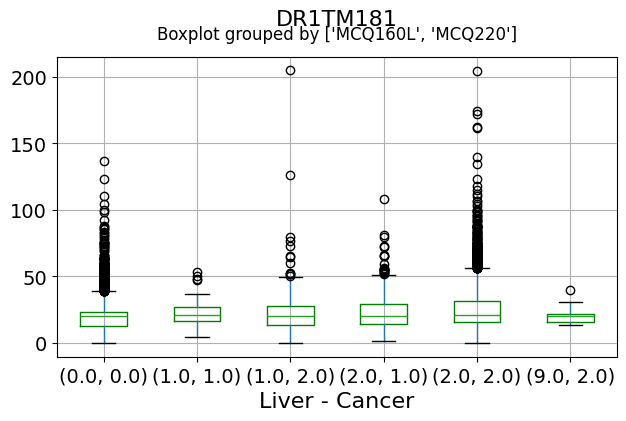

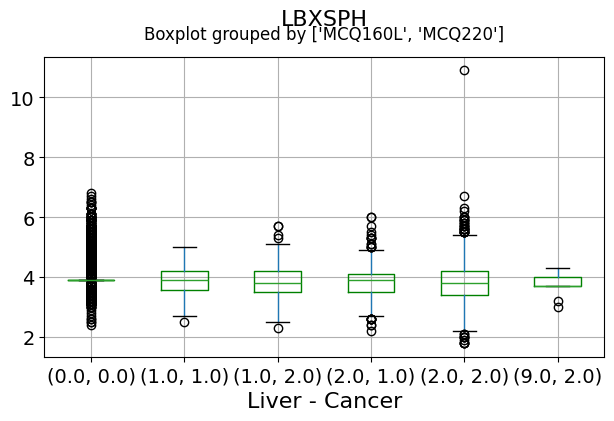

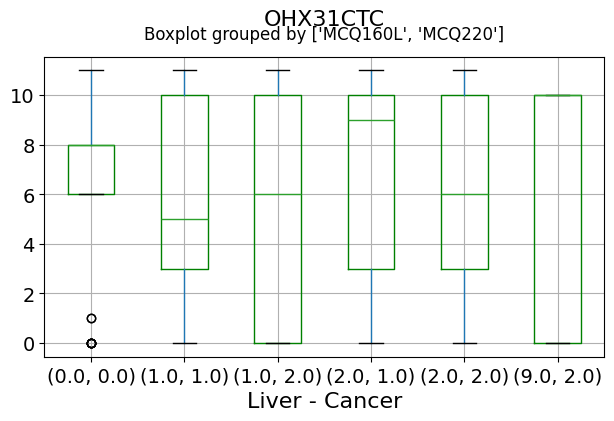

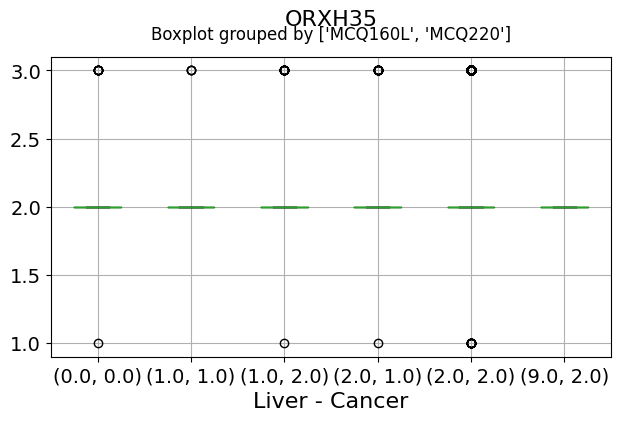

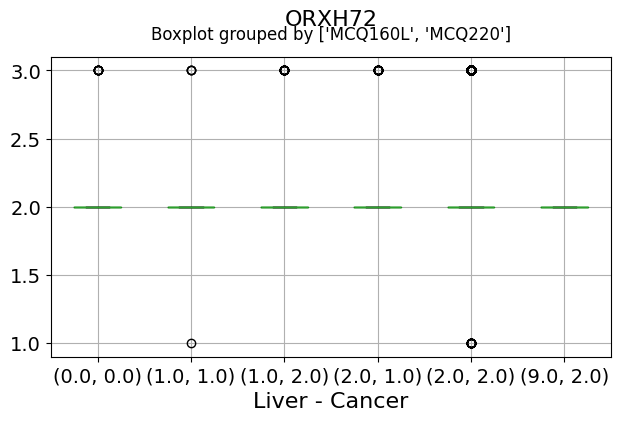

...

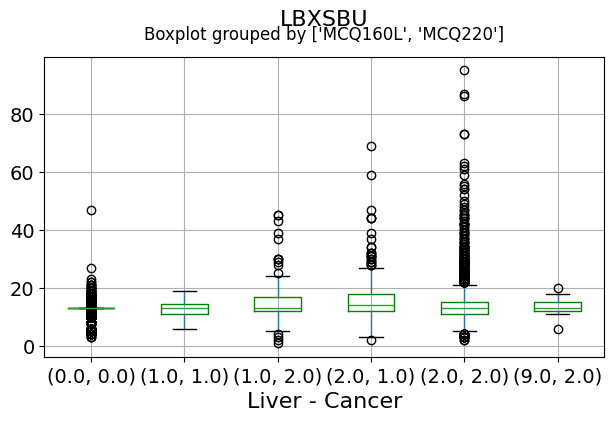

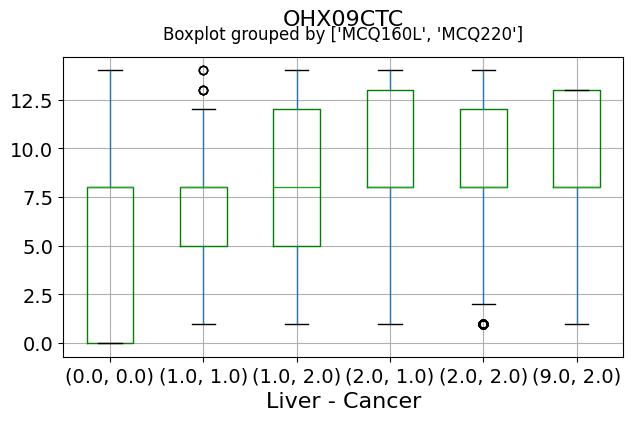

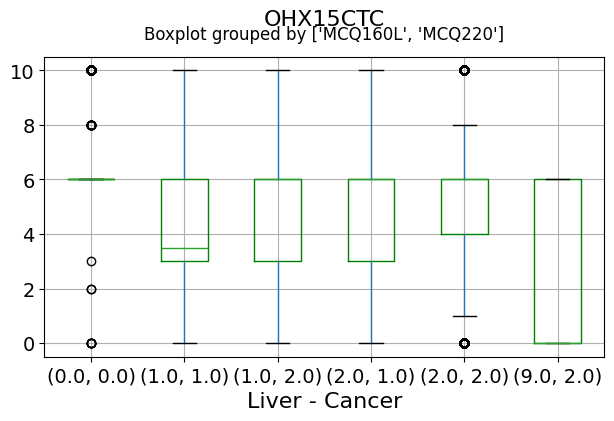

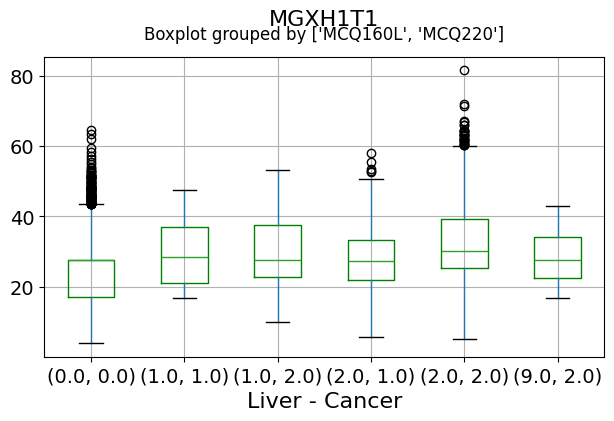

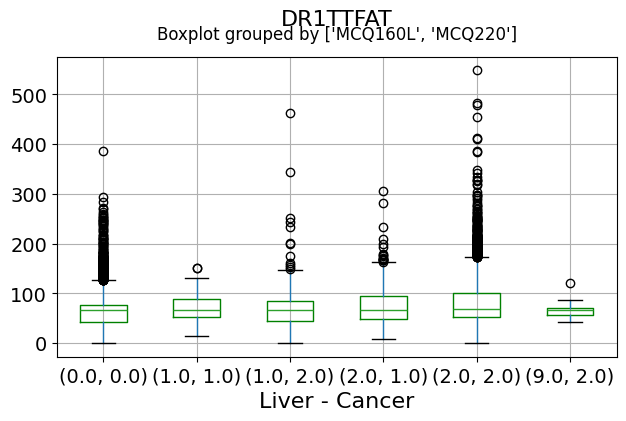

In [4]:

dimension_reduction_process.describe()

In [5]:
dimension_reduction_process.data_scaling()


----------------------------------------------------------------------------------------------------
 Normalized Data:
   DR1TM181     LBXSPH  OHX31CTC    ORXH35    ORXH72   OHX16TC   OHX17TC  \
0 -0.246799  -0.164364 -0.363253  0.581034 -1.135602  0.096036  0.096666   
1  6.951914  10.651455  0.688980  0.133928 -2.001861  0.096036  0.096666   
2 -0.297808  -0.715401 -0.153654  0.469257 -2.001861  0.096036  0.096666   
3 -0.285056  -0.264553 -0.970711  0.133928  0.308164  0.096036  0.096666   
4 -0.310561  -0.929441  0.032319  0.692811 -2.001861  0.096036  0.096666   
5  0.091139   1.315695  1.023907 -0.536732 -2.001861  0.096036  0.096666   
6 -0.253175  -0.232674 -0.138443  0.133928  1.174424  0.096036  0.096666   
7 -0.240423  -0.423944 -0.125116 -0.201402  0.885671  0.096036  0.096666   
8 -0.310561  -1.116156 -1.493765 -4.225360 -2.001861 -4.682283 -4.677962   
9 -0.310561  -0.938549 -0.534889  1.587024  0.885671  0.096036  0.096666   

     ORXH70    LBXBSE  OHX14CTC  ...  OHX18C

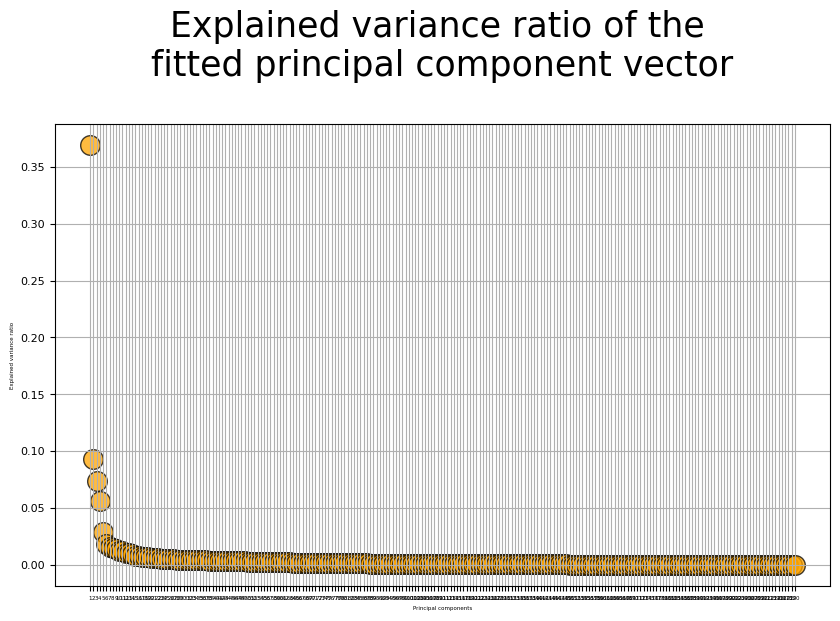

         0          1         2          3         4         5         6    \
0  -3.955443  -2.587619  2.159496  10.903052  3.676363 -0.062788 -0.118003   
1  -7.963148  16.870811  4.643847  -0.450238  1.712080  4.944287  3.791382   
2  -3.118385   0.001217 -2.926676   0.640330 -2.942331 -1.143576 -1.288293   
3   1.417611  -2.186179  2.820086  -0.940669  3.614011  0.505148 -0.683021   
4  -2.333656  -1.820033  0.010885   4.069831  4.703394  3.345225 -2.388651   
5  -4.341608   0.907481 -1.249137   5.830956  0.637662  0.615921  1.771080   
6  -2.242193  -1.726953 -6.396021  -3.285845  1.482216 -1.047499 -1.652864   
7  -2.787388   3.128263 -1.882456  -1.312531  0.452566  1.199247 -2.058253   
8  43.712785   3.636909 -4.042252   0.120632  0.603446  0.072129  0.990241   
9  -1.079075  -2.621646 -3.073530   0.168411  1.523804  1.027824 -1.498888   

         7         8         9    ...       210       211       212       213  \
0  -0.657821 -0.202272  0.167346  ... -0.003710  0.015321 -0

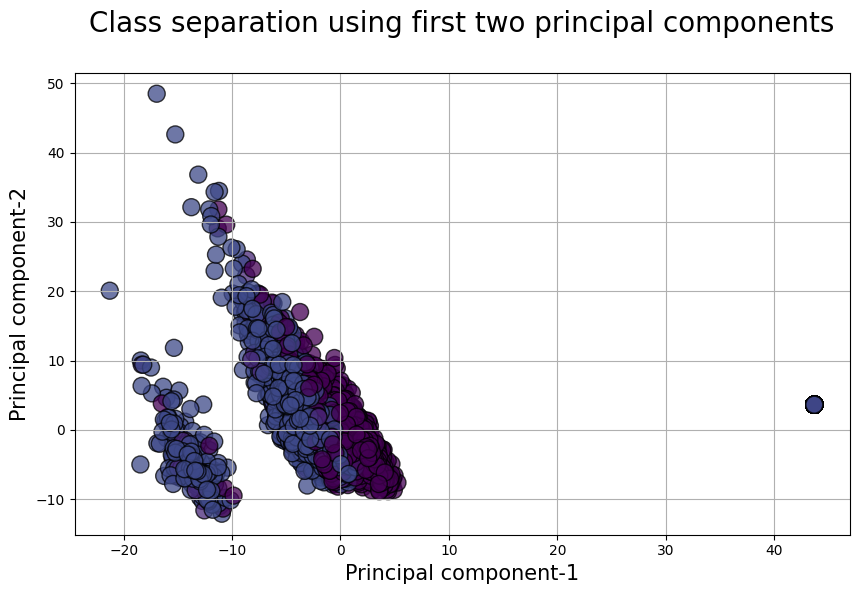

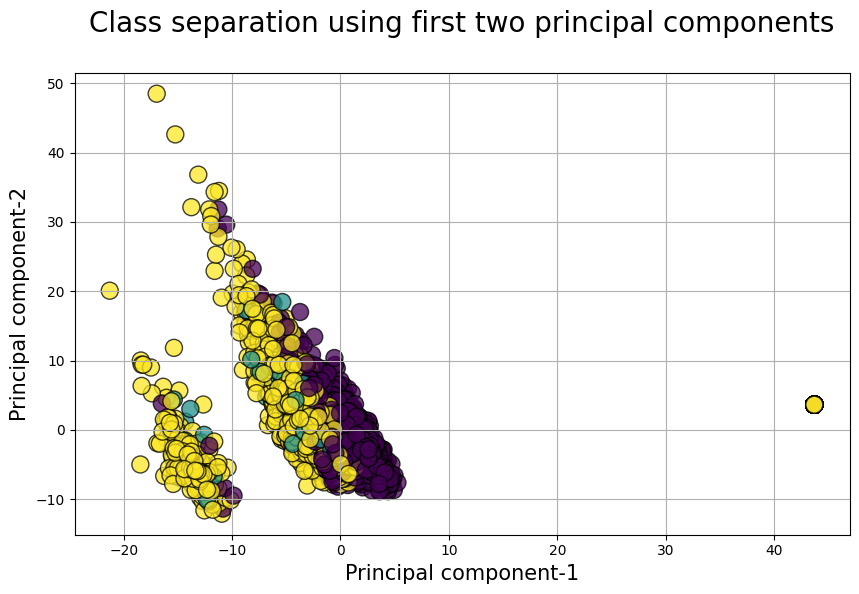

In [6]:
dimension_reduction_process.principal_component_analysis(1)

**The first plot means that the $1^{st}$ principal component explains about 37% of the total variance in the data and the $2^{nd}$ component explians further 9%. Therefore, if we just consider first two components, they together explain 46% of the total variance.**

/home/asma-rashidian/Documents/DrRahmani_projects/project1/venv/lib/python3.11/site-packages/sklearn/manifold/_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/home/asma-rashidian/Documents/DrRahmani_projects/project1/venv/lib/python3.11/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


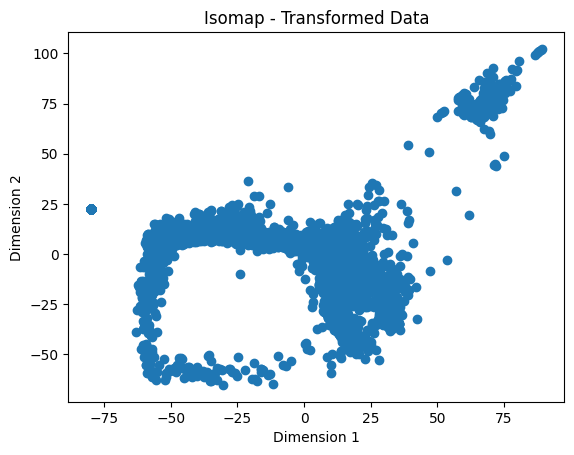

           0          1          2          3          4
0  15.328138 -39.124628 -27.635195  32.450540  -5.261379
1  23.317767  -2.639663 -16.658663 -14.371996  42.149603
2  14.328791  -4.946209  -0.092378  -9.847738  -2.440641
3 -15.682665   5.846098   0.076420   1.717822  -4.914558
4   9.379735  -4.910399 -11.595107   1.174322  -3.777084
5   7.753883  -7.092369  -8.964445  -3.876398  -5.647111
6  35.372172 -34.573765  52.265694 -27.113798 -18.684101
7  15.560069   1.463529  -0.942873  -9.165550   3.855225
8 -79.897375  22.620820 -22.686002 -21.947382 -27.073485
9   9.204956  -0.835728  -4.710756  -2.114412  -2.836344


In [8]:
dimension_reduction_process.isometric_mapping(1)

## Second Aproach 
The Outliers are **not Considered** and they have  being removed!! 

In [9]:
path = "/home/asma-rashidian/Documents/DrRahmani_projects/project1/data/result/outlier.csv"
dimension_reduction_process = DimensionReductionProcess(path)

/home/asma-rashidian/Documents/DrRahmani_projects/project1/venv/lib/python3.11/site-packages/pandas/plotting/_matplotlib/tools.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


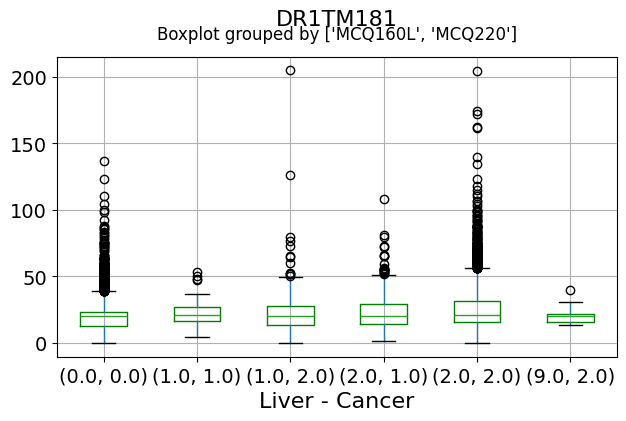

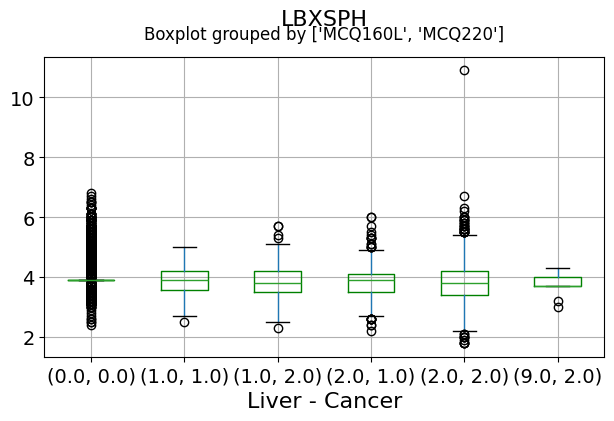

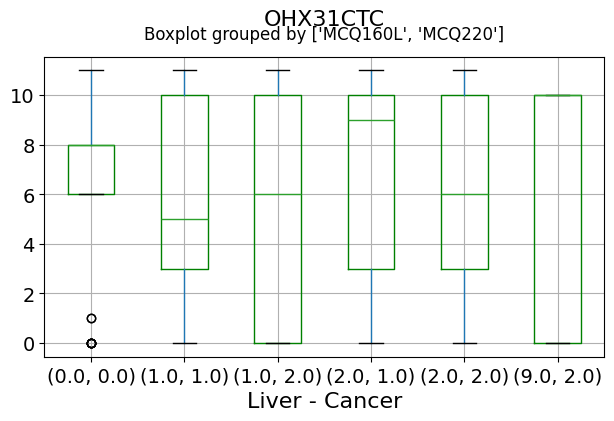

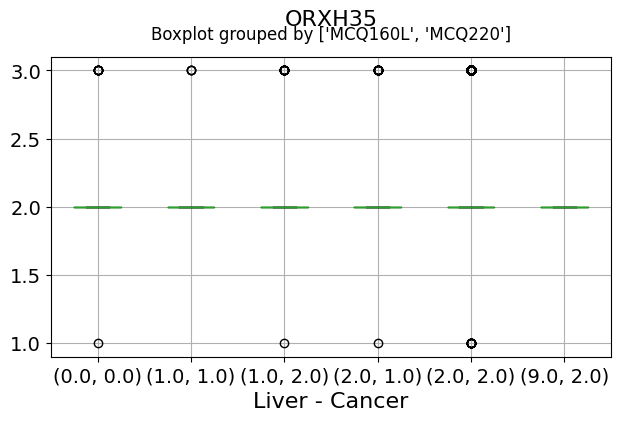

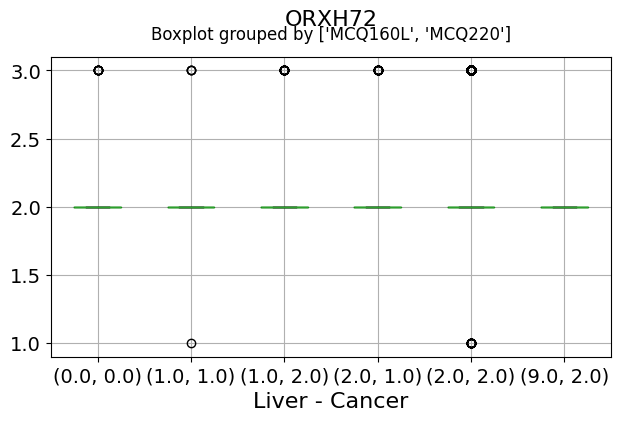

...

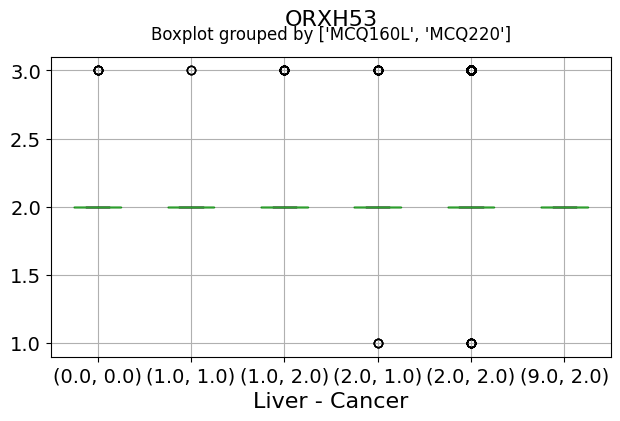

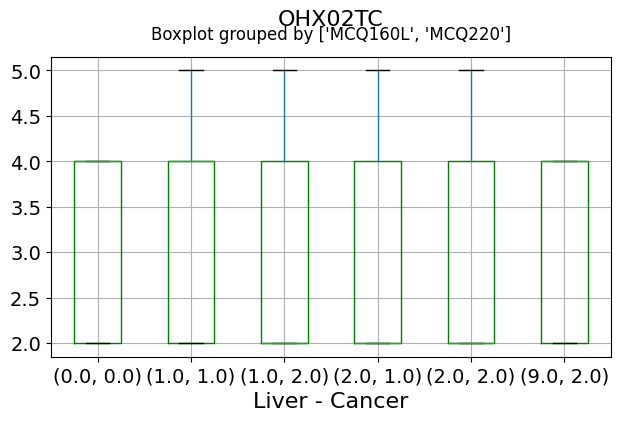

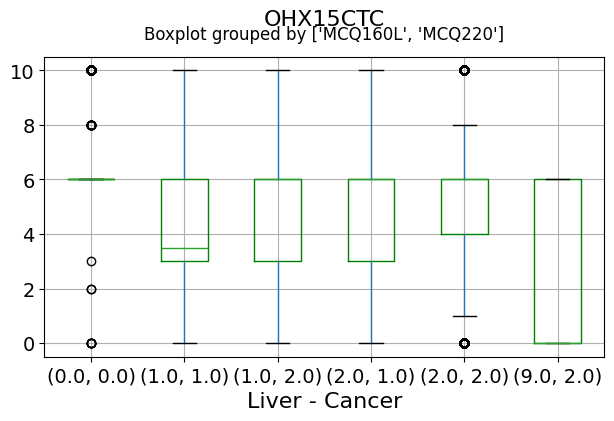

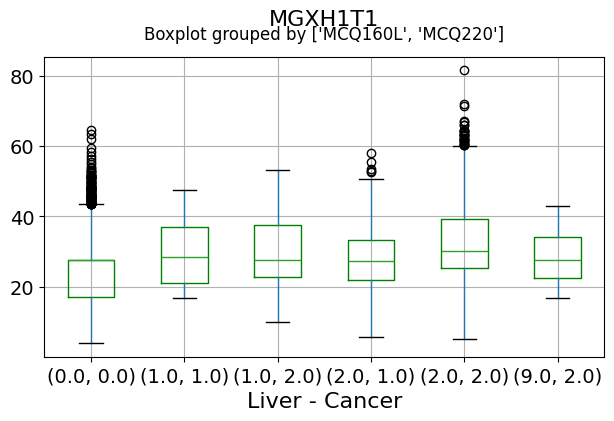

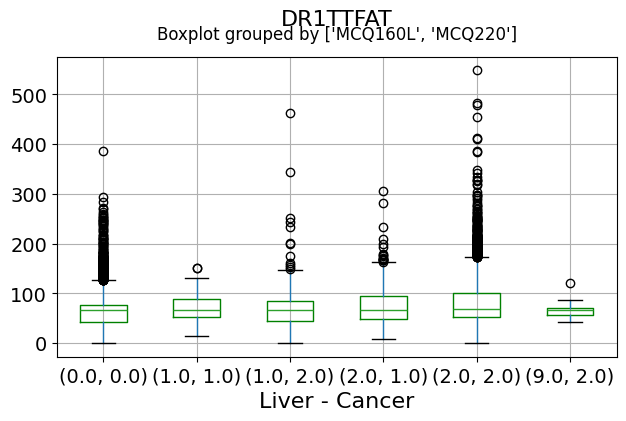

In [10]:
dimension_reduction_process.describe()

In [11]:
dimension_reduction_process.data_scaling()


----------------------------------------------------------------------------------------------------
 Normalized Data:
   DR1TM181     LBXSPH  OHX31CTC    ORXH35    ORXH72   OHX16TC   OHX17TC  \
0 -0.246799  -0.164364 -0.363253  0.581034 -1.135602  0.096036  0.096666   
1  6.951914  10.651455  0.688980  0.133928 -2.001861  0.096036  0.096666   
2 -0.297808  -0.715401 -0.153654  0.469257 -2.001861  0.096036  0.096666   
3 -0.285056  -0.264553 -0.970711  0.133928  0.308164  0.096036  0.096666   
4 -0.310561  -0.929441  0.032319  0.692811 -2.001861  0.096036  0.096666   
5  0.091139   1.315695  1.023907 -0.536732 -2.001861  0.096036  0.096666   
6 -0.253175  -0.232674 -0.138443  0.133928  1.174424  0.096036  0.096666   
7 -0.240423  -0.423944 -0.125116 -0.201402  0.885671  0.096036  0.096666   
8 -0.310561  -1.116156 -1.493765 -4.225360 -2.001861 -4.682283 -4.677962   
9 -0.310561  -0.938549 -0.534889  1.587024  0.885671  0.096036  0.096666   

     ORXH70  OHX14CTC    LBXBGE  ...  OHX30C

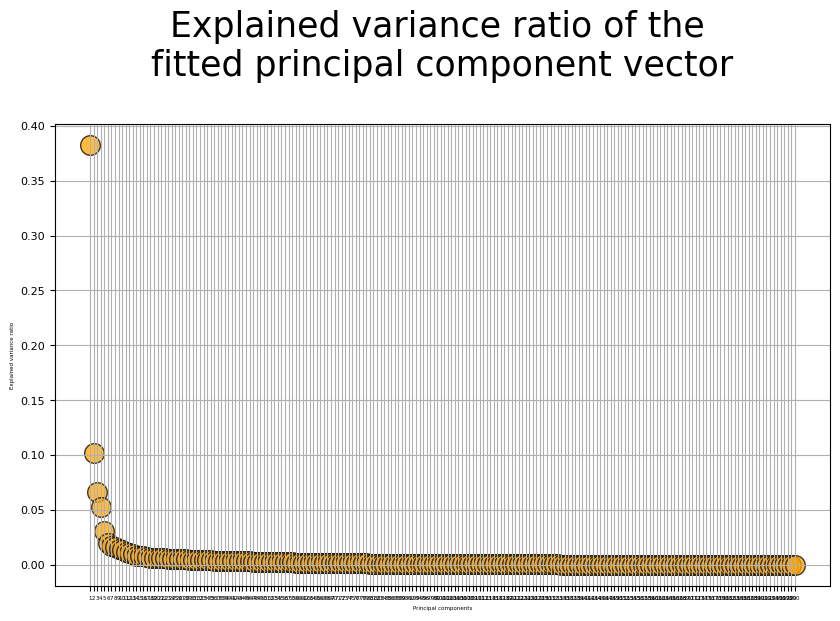

         0          1         2         3         4         5         6    \
0  -3.716725  -2.758011  2.446377  9.952243  4.074715 -0.116639 -0.291587   
1  -7.884749  17.038685  4.103855 -0.486588  1.385103  4.655465  4.911334   
2  -3.013742  -0.138651 -3.085136  1.179880 -2.615498 -1.258966 -1.524265   
3   1.125501  -1.978505  3.150992 -0.242756  3.511652  0.242596 -0.693052   
4  -1.712164  -1.888742  1.196214  3.561952  4.594142  3.423097 -2.076981   
5  -3.503456   0.749153 -0.354907  5.305565  0.608402  0.498343  1.853576   
6  -1.717905  -1.959556 -5.387960 -3.158368  1.426000 -0.896879 -1.379519   
7  -2.617125   3.125048 -2.341293 -1.087765  0.722884  1.247115 -2.018334   
8  42.580835   3.447715 -3.258029 -0.224125  0.712343  0.118458  0.896073   
9  -0.562820  -2.828920 -1.946908 -0.253021  1.151208  1.070356 -1.454659   

         7         8         9    ...       190       191       192       193  \
0  -0.260726 -0.314345  0.105499  ...  0.004238 -0.005140 -0.039915  0.

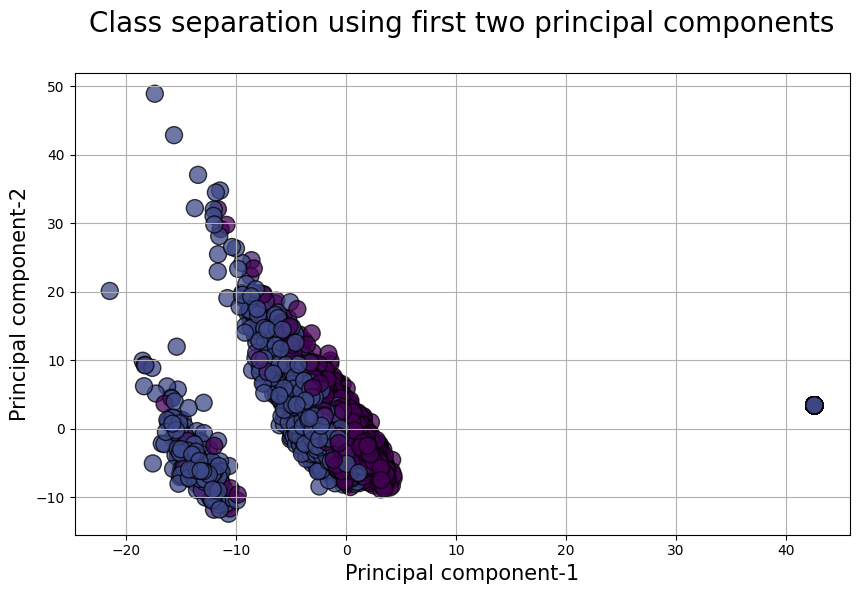

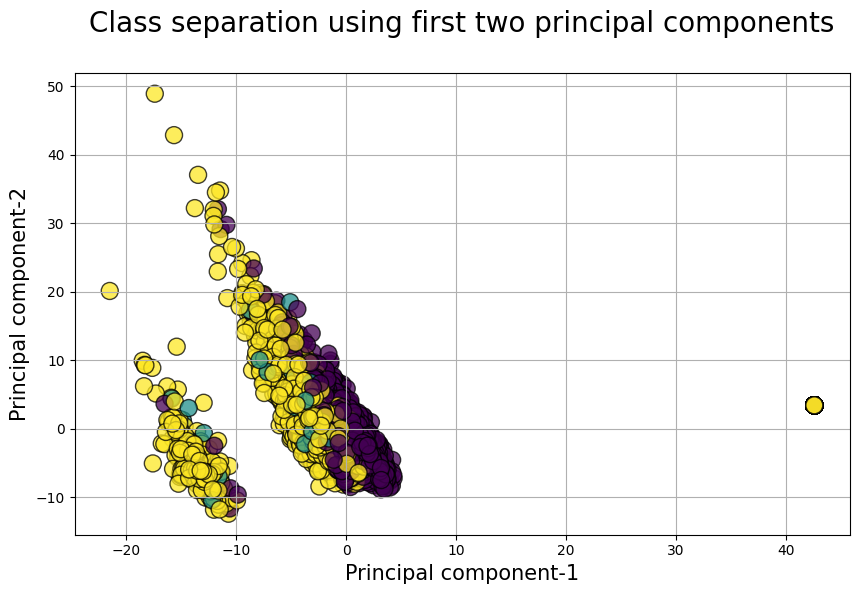

In [12]:
dimension_reduction_process.principal_component_analysis(2)

**The first plot means that the $1^{st}$ principal component explains about 38% of the total variance in the data and the $2^{nd}$ component explians further 11%. Therefore, if we just consider first two components, they together explain 49% of the total variance.**

/home/asma-rashidian/Documents/DrRahmani_projects/project1/venv/lib/python3.11/site-packages/sklearn/manifold/_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/home/asma-rashidian/Documents/DrRahmani_projects/project1/venv/lib/python3.11/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


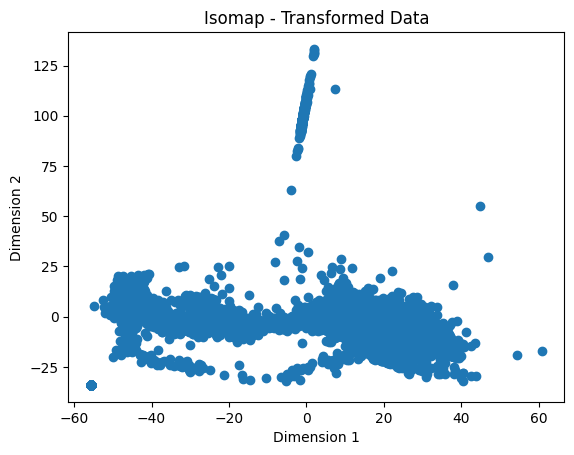

           0          1          2          3          4
0  22.720666 -21.056705  30.438209 -31.588172 -14.808901
1  31.634604   2.302353 -10.923738  -3.295213  34.928471
2  14.284956   0.600226  -4.441612   0.857282  -0.283206
3 -14.033442  -7.942707  -0.941960  -0.412971   1.527368
4   7.521408  -9.828621   8.277805 -14.566893  -6.616634
5   9.639685  -2.837524  -3.719364  -3.877126  -3.627032
6  20.728714 -18.116810   1.695865  47.984181 -25.417249
7  16.135373   6.140598  -6.411271  -1.027525   2.372879
8 -55.649062 -34.022465 -46.784907 -13.062245 -13.617705
9   7.087327  -0.211490  -2.628784  -0.444620  -2.785457


In [13]:
dimension_reduction_process.isometric_mapping(2)